In [27]:
import math
import copy
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

#-------------------------------------Всякие нужные функции-----------------------------------------

def add_noise(image):
    """Добавление гауссова и постоянного шума к изображению"""
    # Гауссов шум
    row, col, ch = image.shape
    mean = 0
    var = 0.01
    sigma = var**0.5
    gaussian = np.random.normal(mean, sigma, (row, col, ch))
    gaussian = gaussian.reshape(row, col, ch)
    gaussian_noise_img = image + gaussian * 255
    gaussian_noise_img = np.clip(gaussian_noise_img, 0, 255).astype(np.uint8)
    
    # Постоянный шум (соль и перец)
    salt_pepper_noise_img = image.copy()
    amount = 0.45  # 5% пикселей будут зашумлены
    # Соль
    num_salt = np.ceil(amount * image.size * 0.5)
    coords = [np.random.randint(0, i-1, int(num_salt)) for i in image.shape]
    salt_pepper_noise_img[coords[0], coords[1], :] = 255
    # Перец
    num_pepper = np.ceil(amount * image.size * 0.5)
    coords = [np.random.randint(0, i-1, int(num_pepper)) for i in image.shape]
    salt_pepper_noise_img[coords[0], coords[1], :] = 0
    
    # Комбинированный шум
    combined_noise_img = gaussian_noise_img.copy()
    combined_noise_img = cv2.addWeighted(combined_noise_img, 0.7, salt_pepper_noise_img, 0.3, 0)
    
    return gaussian_noise_img, salt_pepper_noise_img, combined_noise_img


def plot_results(images, titles, figsize=(15, 10)):
    """Визуализация результатов"""
    fig, axes = plt.subplots(2, 3, figsize=figsize)
    axes = axes.ravel()
    
    for i, (image, title) in enumerate(zip(images, titles)):
        if len(image.shape) == 3:
            axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        else:
            axes[i].imshow(image, cmap='gray')
        axes[i].set_title(title)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()

In [28]:
#def main():
# Загрузка изображения
image_path = "sar_1.jpg"
#input("Введите путь к изображению или нажмите Enter для использования тестового изображения: ")

if image_path == "":
    # Создание тестового изображения, если путь не указан
    print("Создание тестового изображения...")
    test_image = np.zeros((300, 300, 3), dtype=np.uint8)
    cv2.rectangle(test_image, (50, 50), (250, 250), (255, 0, 0), -1)
    cv2.circle(test_image, (150, 150), 80, (0, 255, 0), -1)
    cv2.putText(test_image, 'TEST', (100, 160), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    original = test_image
else:
    original = cv2.imread(image_path)
    if original is None:
        print("Ошибка загрузки изображения. Создание тестового изображения...")
        test_image = np.zeros((300, 300, 3), dtype=np.uint8)
        cv2.rectangle(test_image, (50, 50), (250, 250), (255, 0, 0), -1)
        cv2.circle(test_image, (150, 150), 80, (0, 255, 0), -1)
        original = test_image

Добавление шума к изображению...
Зашумленные изображения:


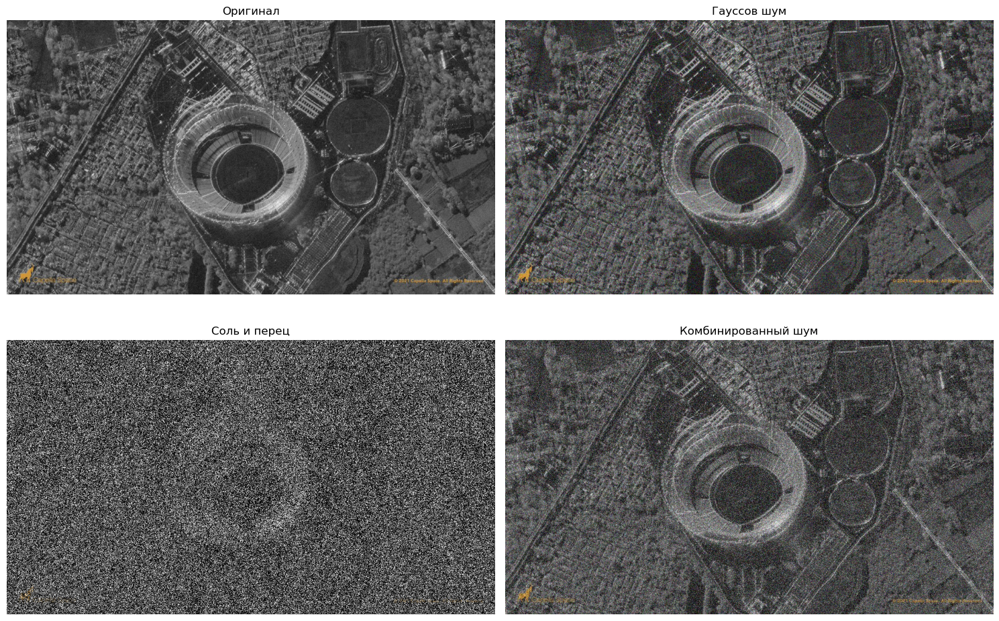

In [29]:
# --------------------------------------Добавление шума---------------------------------
print("Добавление шума к изображению...")
gaussian_noise, salt_pepper_noise, combined_noise = add_noise(original)

# Отображение зашумленных изображений
print("Зашумленные изображения:")

images_b = [original, gaussian_noise, salt_pepper_noise, combined_noise]
descr_b = ['Оригинал', 'Гауссов шум', 'Соль и перец', 'Комбинированный шум']

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.ravel()

for i, (image, title) in enumerate(zip(images_b, descr_b)):
    #if len(image.shape) == 2:
    axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    #else:
        #axes[i].imshow(image, cmap='gray')
    axes[i].set_title(title)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [30]:
# ----------------------Тестирование фильтров на комбинированном шуме-----------------------------

# Параметры для тестирования
filter_configs = [
    {'name': 'median',    'params':  [{'kernel_size': 3},             {'kernel_size': 5}]},
    {'name': 'gaussian',  'params':  [{'kernel_size': 3, 'sigma': 1}, {'kernel_size': 5, 'sigma': 1.5}]},
    {'name': 'bilateral', 'params':  [{'d': 9,  'sigma_color': 75,  'sigma_space': 75},
                                      {'d': 15, 'sigma_color': 150, 'sigma_space': 150}]},
    {'name': 'nl_means',  'params':  [{'h': 10, 'template_window_size': 7, 'search_window_size': 21},
                                      {'h': 20, 'template_window_size': 7, 'search_window_size': 21}]}
]

In [31]:
def test_filters(original, noisy_image, filter_name, **params):
    """Тестирование различных фильтров"""
    filtered = None
    
    if filter_name == 'median':
        kernel_size = params.get('kernel_size', 3)
        filtered = cv2.medianBlur(noisy_image, kernel_size)
    
    elif filter_name == 'gaussian':
        kernel_size = params.get('kernel_size', 5)
        sigma = params.get('sigma', 1.0)
        filtered = cv2.GaussianBlur(noisy_image, (kernel_size, kernel_size), sigma)
    
    elif filter_name == 'bilateral':
        d = params.get('d', 9)
        sigma_color = params.get('sigma_color', 75)
        sigma_space = params.get('sigma_space', 75)
        filtered = cv2.bilateralFilter(noisy_image, d, sigma_color, sigma_space)
    
    elif filter_name == 'nl_means':
        h = params.get('h', 10)
        template_window_size = params.get('template_window_size', 7)
        search_window_size = params.get('search_window_size', 21)
        filtered = cv2.fastNlMeansDenoisingColored(noisy_image, None, h, h, 
                                                  template_window_size, search_window_size)
    
    # Вычисление метрик качества
    psnr_value = psnr(original, filtered)
    ssim_value, _ = ssim(original, filtered, full=True, multichannel=True, channel_axis=2)
    
    return filtered, psnr_value, ssim_value

#--------------------------------------На комбинированном шуме--------------------------------------

print("\nТестирование фильтров на комбинированном шуме:")
results = []
best_filters = []

for config in filter_configs:
    filter_name = config['name']
    print(f"\n--- Тестирование {filter_name} фильтра ---")

    for i, params in enumerate(config['params']):
        filtered, psnr_val, ssim_val = test_filters(original, combined_noise, filter_name, **params)

        result = {
            'filter': filter_name,
            'params': params.copy(),
            'psnr': psnr_val,
            'ssim': ssim_val,
            'image': filtered
        }
        results.append(result)

        param_str = ', '.join([f"{k}={v}" for k, v in params.items()])
        print(f"Параметры {i+1}: {param_str}")
        print(f"PSNR: {psnr_val:.2f} dB, SSIM: {ssim_val:.4f}")

        # Сохраняем лучший результат для каждого типа фильтра
        if not best_filters or best_filters[-1]['filter'] != filter_name:
            best_filters.append(result)
        elif psnr_val > best_filters[-1]['psnr']:
            best_filters[-1] = result


Тестирование фильтров на комбинированном шуме:

--- Тестирование median фильтра ---
Параметры 1: kernel_size=3
PSNR: 21.91 dB, SSIM: 0.4754
Параметры 2: kernel_size=5
PSNR: 22.64 dB, SSIM: 0.4770

--- Тестирование gaussian фильтра ---
Параметры 1: kernel_size=3, sigma=1
PSNR: 23.29 dB, SSIM: 0.5565
Параметры 2: kernel_size=5, sigma=1.5
PSNR: 23.63 dB, SSIM: 0.5514

--- Тестирование bilateral фильтра ---
Параметры 1: d=9, sigma_color=75, sigma_space=75
PSNR: 19.06 dB, SSIM: 0.3333
Параметры 2: d=15, sigma_color=150, sigma_space=150
PSNR: 22.05 dB, SSIM: 0.4326

--- Тестирование nl_means фильтра ---
Параметры 1: h=10, template_window_size=7, search_window_size=21
PSNR: 17.30 dB, SSIM: 0.3023
Параметры 2: h=20, template_window_size=7, search_window_size=21
PSNR: 21.35 dB, SSIM: 0.4407



Лучшие результаты для каждого типа фильтра:


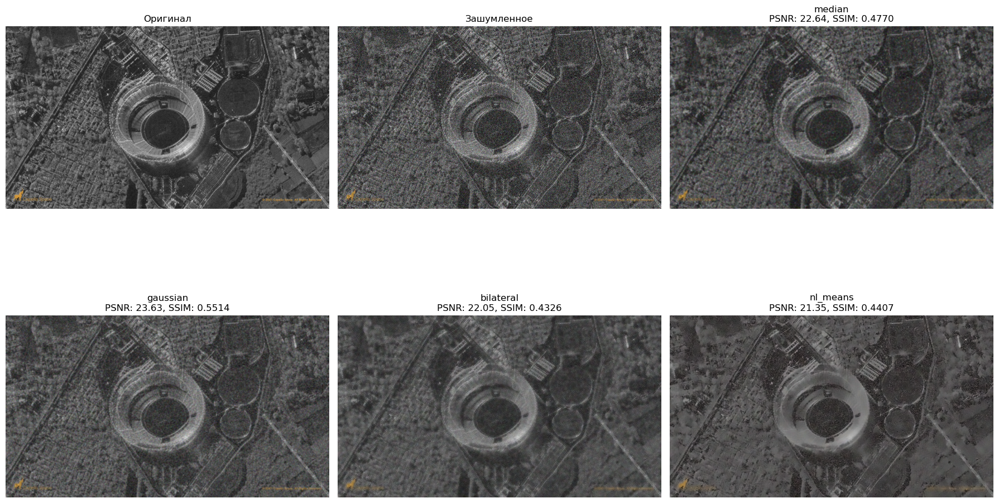

In [32]:
# Визуализация лучших результатов
print("\nЛучшие результаты для каждого типа фильтра:")
best_images = [original, combined_noise]
best_titles = ['Оригинал', 'Зашумленное']

for result in best_filters:
    best_images.append(result['image'])
    param_str = ', '.join([f"{k}={v}" for k, v in result['params'].items()])
    best_titles.append(f"{result['filter']}\nPSNR: {result['psnr']:.2f}, SSIM: {result['ssim']:.4f}")

plot_results(best_images, best_titles, figsize=(18, 12))

In [33]:
# Подведение итогов
print("\n" + "-"*60)
print("ИТОГИ ТЕСТИРОВАНИЯ ФИЛЬТРОВ")
print("-"*60)


------------------------------------------------------------
ИТОГИ ТЕСТИРОВАНИЯ ФИЛЬТРОВ
------------------------------------------------------------


In [34]:
# Сортируем результаты по PSNR
sorted_results = sorted(results, key=lambda x: x['psnr'], reverse=True)

print("\nРейтинг фильтров по PSNR:")
for i, result in enumerate(sorted_results[:5], 1):
    param_str = ', '.join([f"{k}={v}" for k, v in result['params'].items()])
    print(f"{i}. {result['filter']} ({param_str}): {result['psnr']:.2f} dB, SSIM: {result['ssim']:.4f}")


Рейтинг фильтров по PSNR:
1. gaussian (kernel_size=5, sigma=1.5): 23.63 dB, SSIM: 0.5514
2. gaussian (kernel_size=3, sigma=1): 23.29 dB, SSIM: 0.5565
3. median (kernel_size=5): 22.64 dB, SSIM: 0.4770
4. bilateral (d=15, sigma_color=150, sigma_space=150): 22.05 dB, SSIM: 0.4326
5. median (kernel_size=3): 21.91 dB, SSIM: 0.4754


In [35]:
# Анализ результатов
print("-" * 40)
print("\nАНАЛИЗ РЕЗУЛЬТАТОВ:")
print("-" * 40)

best_overall = sorted_results[0]
print(f"Лучший фильтр: {best_overall['filter']}")
print(f"Параметры: {best_overall['params']}")
print(f"Качество: PSNR = {best_overall['psnr']:.2f} dB, SSIM = {best_overall['ssim']:.4f}")

#if __name__ == "__main__":
   # main()

----------------------------------------

АНАЛИЗ РЕЗУЛЬТАТОВ:
----------------------------------------
Лучший фильтр: gaussian
Параметры: {'kernel_size': 5, 'sigma': 1.5}
Качество: PSNR = 23.63 dB, SSIM = 0.5514


In [36]:
#--------------------------------------На линейном шуме--------------------------------------
print("\nТестирование фильтров на линейном шуме:")
results = []
best_filters = []

for config in filter_configs:
    filter_name = config['name']
    print(f"\n--- Тестирование {filter_name} фильтра ---")

    for i, params in enumerate(config['params']):
        filtered, psnr_val, ssim_val = test_filters(original, salt_pepper_noise, filter_name, **params)

        result = {
            'filter': filter_name,
            'params': params.copy(),
            'psnr': psnr_val,
            'ssim': ssim_val,
            'image': filtered
        }
        results.append(result)

        param_str = ', '.join([f"{k}={v}" for k, v in params.items()])
        print(f"Параметры {i+1}: {param_str}")
        print(f"PSNR: {psnr_val:.2f} dB, SSIM: {ssim_val:.4f}")

        # Сохраняем лучший результат для каждого типа фильтра
        if not best_filters or best_filters[-1]['filter'] != filter_name:
            best_filters.append(result)
        elif psnr_val > best_filters[-1]['psnr']:
            best_filters[-1] = result


Тестирование фильтров на линейном шуме:

--- Тестирование median фильтра ---
Параметры 1: kernel_size=3
PSNR: 11.05 dB, SSIM: 0.0666
Параметры 2: kernel_size=5
PSNR: 12.49 dB, SSIM: 0.0919

--- Тестирование gaussian фильтра ---
Параметры 1: kernel_size=3, sigma=1
PSNR: 15.09 dB, SSIM: 0.1025
Параметры 2: kernel_size=5, sigma=1.5
PSNR: 17.29 dB, SSIM: 0.1643

--- Тестирование bilateral фильтра ---
Параметры 1: d=9, sigma_color=75, sigma_space=75
PSNR: 7.53 dB, SSIM: 0.0198
Параметры 2: d=15, sigma_color=150, sigma_space=150
PSNR: 7.72 dB, SSIM: 0.0211

--- Тестирование nl_means фильтра ---
Параметры 1: h=10, template_window_size=7, search_window_size=21
PSNR: 7.54 dB, SSIM: 0.0221
Параметры 2: h=20, template_window_size=7, search_window_size=21
PSNR: 7.55 dB, SSIM: 0.0221



Лучшие результаты для каждого типа фильтра:


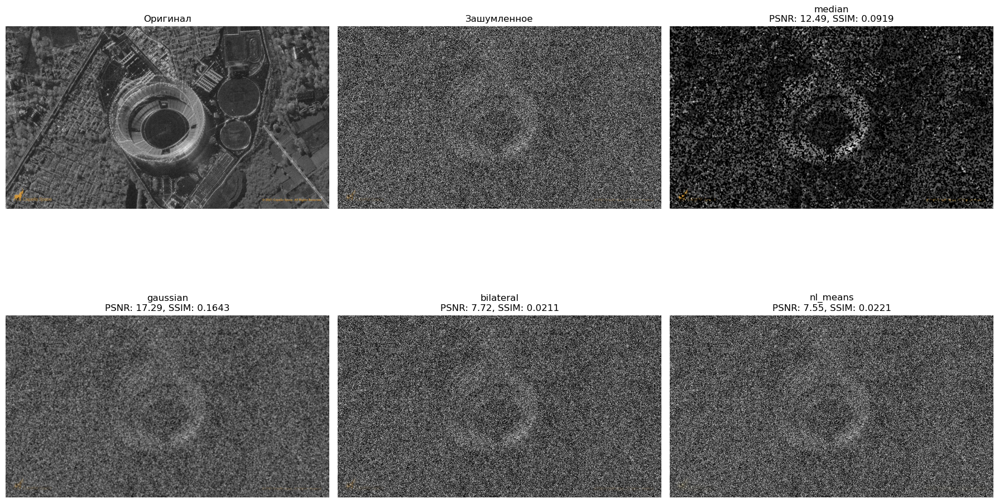

In [37]:
# Визуализация лучших результатов
print("\nЛучшие результаты для каждого типа фильтра:")
best_images = [original, salt_pepper_noise]
best_titles = ['Оригинал', 'Зашумленное']

for result in best_filters:
    best_images.append(result['image'])
    param_str = ', '.join([f"{k}={v}" for k, v in result['params'].items()])
    best_titles.append(f"{result['filter']}\nPSNR: {result['psnr']:.2f}, SSIM: {result['ssim']:.4f}")

plot_results(best_images, best_titles, figsize=(18, 12))

In [38]:
# Подведение итогов
print("\n" + "-"*60)
print("ИТОГИ ТЕСТИРОВАНИЯ ФИЛЬТРОВ")
print("-"*60)


------------------------------------------------------------
ИТОГИ ТЕСТИРОВАНИЯ ФИЛЬТРОВ
------------------------------------------------------------


In [39]:
# Сортируем результаты по PSNR
sorted_results = sorted(results, key=lambda x: x['psnr'], reverse=True)

print("\nРейтинг фильтров по PSNR:")
for i, result in enumerate(sorted_results[:5], 1):
    param_str = ', '.join([f"{k}={v}" for k, v in result['params'].items()])
    print(f"{i}. {result['filter']} ({param_str}): {result['psnr']:.2f} dB, SSIM: {result['ssim']:.4f}")


Рейтинг фильтров по PSNR:
1. gaussian (kernel_size=5, sigma=1.5): 17.29 dB, SSIM: 0.1643
2. gaussian (kernel_size=3, sigma=1): 15.09 dB, SSIM: 0.1025
3. median (kernel_size=5): 12.49 dB, SSIM: 0.0919
4. median (kernel_size=3): 11.05 dB, SSIM: 0.0666
5. bilateral (d=15, sigma_color=150, sigma_space=150): 7.72 dB, SSIM: 0.0211


In [40]:
# Анализ результатов
print("-" * 40)
print("\nАНАЛИЗ РЕЗУЛЬТАТОВ:")
print("-" * 40)

best_overall = sorted_results[0]
print(f"Лучший фильтр: {best_overall['filter']}")
print(f"Параметры: {best_overall['params']}")
print(f"Качество: PSNR = {best_overall['psnr']:.2f} dB, SSIM = {best_overall['ssim']:.4f}")

#if __name__ == "__main__":
   # main()

----------------------------------------

АНАЛИЗ РЕЗУЛЬТАТОВ:
----------------------------------------
Лучший фильтр: gaussian
Параметры: {'kernel_size': 5, 'sigma': 1.5}
Качество: PSNR = 17.29 dB, SSIM = 0.1643


In [41]:
#--------------------------------------На гауссовом шуме--------------------------------------
print("\nТестирование фильтров на гауссовом шуме:")
results = []
best_filters = []

for config in filter_configs:
    filter_name = config['name']
    print(f"\n--- Тестирование {filter_name} фильтра ---")

    for i, params in enumerate(config['params']):
        filtered, psnr_val, ssim_val = test_filters(original, gaussian_noise, filter_name, **params)

        result = {
            'filter': filter_name,
            'params': params.copy(),
            'psnr': psnr_val,
            'ssim': ssim_val,
            'image': filtered
        }
        results.append(result)

        param_str = ', '.join([f"{k}={v}" for k, v in params.items()])
        print(f"Параметры {i+1}: {param_str}")
        print(f"PSNR: {psnr_val:.2f} dB, SSIM: {ssim_val:.4f}")

        # Сохраняем лучший результат для каждого типа фильтра
        if not best_filters or best_filters[-1]['filter'] != filter_name:
            best_filters.append(result)
        elif psnr_val > best_filters[-1]['psnr']:
            best_filters[-1] = result


Тестирование фильтров на гауссовом шуме:

--- Тестирование median фильтра ---
Параметры 1: kernel_size=3
PSNR: 24.82 dB, SSIM: 0.6330
Параметры 2: kernel_size=5
PSNR: 24.30 dB, SSIM: 0.5595

--- Тестирование gaussian фильтра ---
Параметры 1: kernel_size=3, sigma=1
PSNR: 26.27 dB, SSIM: 0.7170
Параметры 2: kernel_size=5, sigma=1.5
PSNR: 25.50 dB, SSIM: 0.6579

--- Тестирование bilateral фильтра ---
Параметры 1: d=9, sigma_color=75, sigma_space=75
PSNR: 26.74 dB, SSIM: 0.7211
Параметры 2: d=15, sigma_color=150, sigma_space=150
PSNR: 24.62 dB, SSIM: 0.5688

--- Тестирование nl_means фильтра ---
Параметры 1: h=10, template_window_size=7, search_window_size=21
PSNR: 22.33 dB, SSIM: 0.5914
Параметры 2: h=20, template_window_size=7, search_window_size=21
PSNR: 24.76 dB, SSIM: 0.5925



Лучшие результаты для каждого типа фильтра:


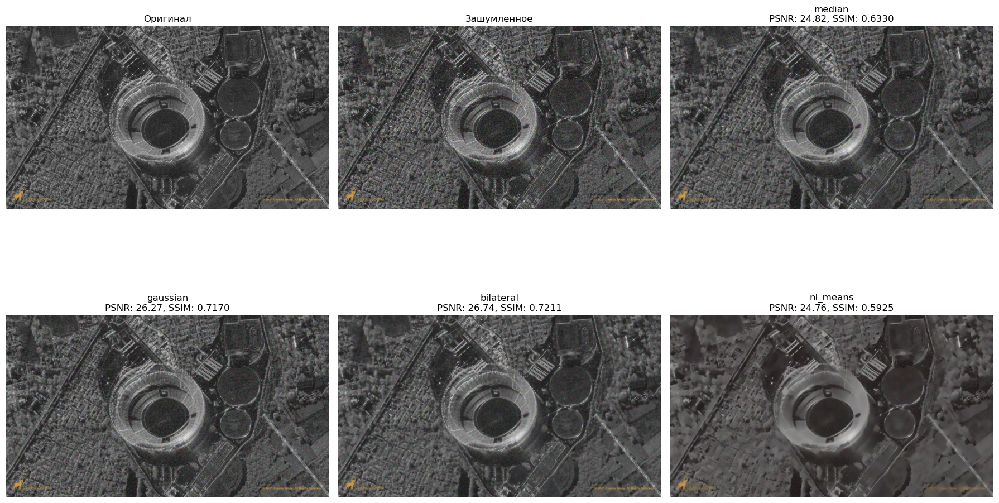

In [42]:
# Визуализация лучших результатов
print("\nЛучшие результаты для каждого типа фильтра:")
best_images = [original, gaussian_noise]
best_titles = ['Оригинал', 'Зашумленное']

for result in best_filters:
    best_images.append(result['image'])
    param_str = ', '.join([f"{k}={v}" for k, v in result['params'].items()])
    best_titles.append(f"{result['filter']}\nPSNR: {result['psnr']:.2f}, SSIM: {result['ssim']:.4f}")

plot_results(best_images, best_titles, figsize=(18, 12))

In [43]:
# Подведение итогов
print("\n" + "-"*60)
print("ИТОГИ ТЕСТИРОВАНИЯ ФИЛЬТРОВ")
print("-"*60)


------------------------------------------------------------
ИТОГИ ТЕСТИРОВАНИЯ ФИЛЬТРОВ
------------------------------------------------------------


In [44]:
# Сортируем результаты по PSNR
sorted_results = sorted(results, key=lambda x: x['psnr'], reverse=True)

print("\nРейтинг фильтров по PSNR:")
for i, result in enumerate(sorted_results[:5], 1):
    param_str = ', '.join([f"{k}={v}" for k, v in result['params'].items()])
    print(f"{i}. {result['filter']} ({param_str}): {result['psnr']:.2f} dB, SSIM: {result['ssim']:.4f}")


Рейтинг фильтров по PSNR:
1. bilateral (d=9, sigma_color=75, sigma_space=75): 26.74 dB, SSIM: 0.7211
2. gaussian (kernel_size=3, sigma=1): 26.27 dB, SSIM: 0.7170
3. gaussian (kernel_size=5, sigma=1.5): 25.50 dB, SSIM: 0.6579
4. median (kernel_size=3): 24.82 dB, SSIM: 0.6330
5. nl_means (h=20, template_window_size=7, search_window_size=21): 24.76 dB, SSIM: 0.5925


In [45]:
# Анализ результатов
print("-" * 40)
print("\nАНАЛИЗ РЕЗУЛЬТАТОВ:")
print("-" * 40)

best_overall = sorted_results[0]
print(f"Лучший фильтр: {best_overall['filter']}")
print(f"Параметры: {best_overall['params']}")
print(f"Качество: PSNR = {best_overall['psnr']:.2f} dB, SSIM = {best_overall['ssim']:.4f}")

#if __name__ == "__main__":
   # main()

----------------------------------------

АНАЛИЗ РЕЗУЛЬТАТОВ:
----------------------------------------
Лучший фильтр: bilateral
Параметры: {'d': 9, 'sigma_color': 75, 'sigma_space': 75}
Качество: PSNR = 26.74 dB, SSIM = 0.7211
